# ${\color{lightblue}Names:}$
* ${\color{yellow}Ehud\ Avrahami}$, id: 215989815 

* ${\color{yellow}Daniel\ Lyumet}$, id: 216163147



In [50]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import os
from torch.utils.data import DataLoader
import torchaudio
import IPython.display as ipd
import torch.nn.functional as F
from librispeech_fork_final import LIBRISPEECH, LIBRISPEECH_MEL
from torchaudio.datasets.librispeech import LIBRISPEECH as LIBRISPEECH_ORIGINAL
from pathlib import Path
import librosa
import shutil
from tqdm import tqdm
from ray import tune

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
g = torch.Generator()
g.manual_seed(42)

AUDIO_EXTENSION = ".flac"

DATA_PATH = "./data"
NORMALIZED_DATA_PATH = "./normalized_data"

TRAIN_DIR = f"{DATA_PATH}/LibriSpeech/train-clean-100"
TRAIN_DIR_NORMALIZED = f"{NORMALIZED_DATA_PATH}/LibriSpeech/train-clean-100"
TEST_DIR = f"{DATA_PATH}/LibriSpeech/test-clean"
TEST_DIR_NORMALIZED = f"{NORMALIZED_DATA_PATH}/LibriSpeech/test-clean"


In [4]:
train_dataset_original = LIBRISPEECH_ORIGINAL(root=DATA_PATH, url="train-clean-100", download=True)
test_dataset_original = LIBRISPEECH_ORIGINAL(root=DATA_PATH, url="test-clean", download=True)

waveform, sample_rate, utterance, speaker_id, chapter_id, utterance_id = train_dataset_original[0]

wave_form = waveform.t().numpy()

# The Crappification Process
#### To create a model that can reduce noise from audio we need to have 2 types of audio waves, noisy audio and the matching clean one.
#### So because our data is just the clean audio, we need to artificially apply noise to the data.

## First noise

In [5]:
def make_first_noise(wave):
    # this process takes the wave and decreasing or increasing it randomly between (0.6,0.9) or (1.1,1.4)
    # the + random of half means that to the inetrval (0.6,0.9) we randomly add 0.5 or 0,
    # meaning half of the times it's (0.6,0.9) (decrease) and the other half (1.1,1.4) (increase)
    return wave * (np.random.uniform(0.6, 0.9, size=wave.shape) + np.random.choice([0, 0.5], size=wave.shape))


first_noisy_wave_form = make_first_noise(wave_form)

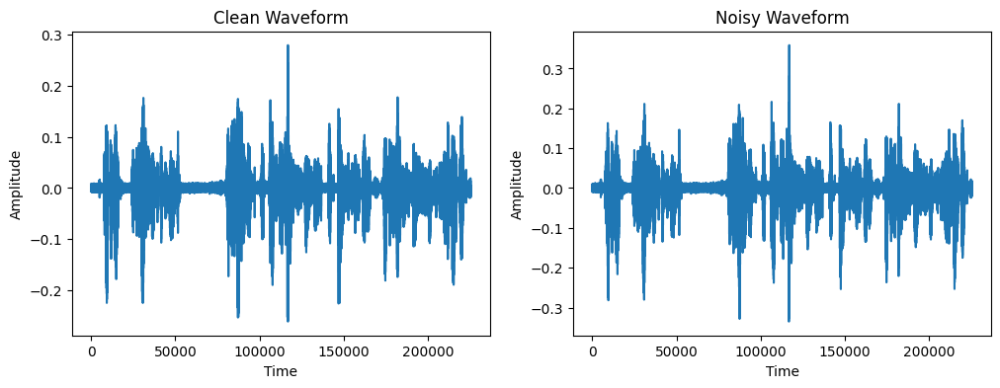

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(wave_form)
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Amplitude')
axes[0].set_title('Clean Waveform')

axes[1].plot(first_noisy_wave_form)
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Amplitude')
axes[1].set_title('Noisy Waveform')

plt.show()

In [7]:
ipd.Audio(first_noisy_wave_form.T, rate=sample_rate)

In [8]:
ipd.Audio(waveform, rate=sample_rate)

In [9]:
def plot_graph(x,t):
    plt.subplot(3, 1, 1)
    plt.plot(t, x)
    plt.title('Signal')
    plt.xlabel('Time (s)')
    plt.show()
t = np.linspace(1, 100, 1000)
x = 10 * np.sin(t / (2 * np.pi))

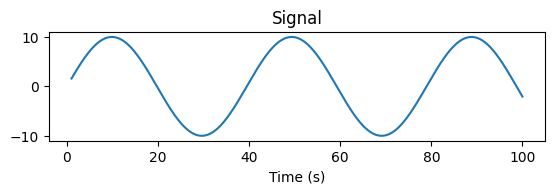

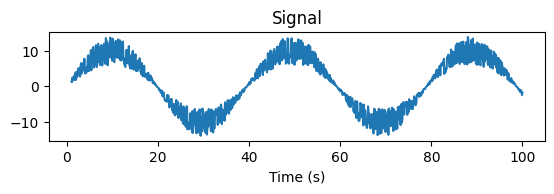

In [10]:
plot_graph(x,t)
plot_graph(make_first_noise(x),t) 

# Second noise

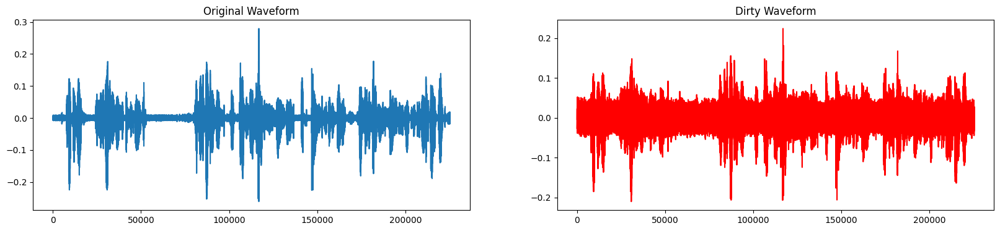

In [11]:
def make_second_noise(wave):
    # here we add some White Noise using normal distribution,
    # the mean is 0, the variance is chosen randomly it's the amplitude of the signal,
    # multiplied randomly by a value from the interval (0.1,0.3)
    # and then it is normalized to be with the norm of the original wave.
    samples = 0.6 * np.random.normal(0, np.max(np.abs(wave)) * np.random.uniform(0.06, 0.1), size=wave.shape)
    return (wave + samples) * np.linalg.norm(wave) / np.linalg.norm(wave + samples)


second_noisy_wave_form = make_second_noise(wave_form)

fig, ax = plt.subplots(1, 2, figsize=(20, 4))
ax[0].plot(wave_form)
ax[0].set_title('Original Waveform')

ax[1].plot(second_noisy_wave_form, color='r')
ax[1].set_title('Dirty Waveform')
plt.show()

In [12]:
ipd.Audio(second_noisy_wave_form.T, rate=sample_rate)

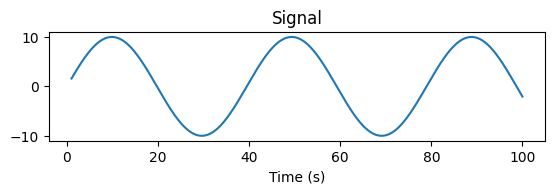

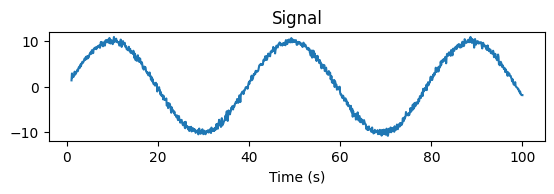

In [13]:
plot_graph(x,t) 
plot_graph(make_second_noise(x),t) 

# Third Noise
lets add 2 voices together

In [14]:
def add_2_sounds(wave1, wave2):  # adding wave1 to wave 2
    wave1_copy = np.copy(wave1)
    shape1 = wave1.shape[0]
    shape2 = wave2.shape[0]
    
    amplitude = np.random.uniform(0.15, 0.3)
    if (shape1 < shape2):
        return wave1+amplitude*wave2[:wave1.shape[0], :]
    if (shape1 == shape2):
        return wave1+amplitude*wave2
    residual = shape1
    for i in range(shape1//shape2):
        residual -= shape2
        wave1_copy[i * shape2:(i + 1) * shape2, :] += amplitude * wave2
    wave1_copy[shape1 - residual:shape1, :] += amplitude * wave2[:residual, :]
    return wave1_copy


def add_3_sounds(wave1, wave2, wave3):
    return add_2_sounds(add_2_sounds(wave1, wave2), wave3)


def make_third_noise(wave1, wave2, wave3):
    return add_3_sounds(wave1, wave2, wave3)

In [15]:
wave_form1 = train_dataset_original[0][0].t().numpy()
wave_form2 = train_dataset_original[1][0].t().numpy()
wave_form3 = train_dataset_original[2][0].t().numpy()

third_noisy_wave_form = make_third_noise(wave_form1, wave_form2, wave_form3)

In [16]:
ipd.Audio(third_noisy_wave_form.T, rate=sample_rate)

In [17]:
ipd.Audio(waveform, rate=16000)

In [18]:
def noise_function(wave, wave1, wave2):
    return make_first_noise(make_second_noise(make_third_noise(wave, wave1, wave2)))


noisy_wave = noise_function(wave_form1, wave_form2, wave_form3)

In [19]:
ipd.Audio(noisy_wave.T, rate=sample_rate)

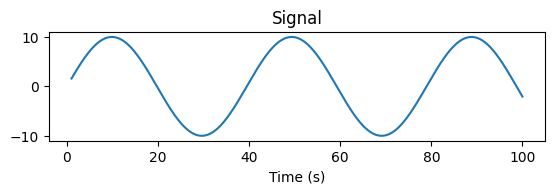

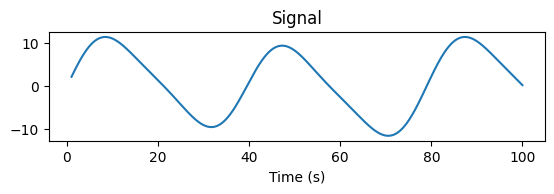

In [20]:
plot_graph(x, t)
plot_graph(make_third_noise(x, 10 * np.sin(t / (4 * np.pi)),10 * np.sin(t / ( np.pi))),t)

# Conclusion noise types.
we had 4 types of noise 
1) #### First type - disturbing the signal
This way take the wave, and in each time sample it is changed,<br>
for example, if in t=1sec the value is 0.1, then after noising it will <br>
randomly change to for example 0.13   <br>

2) #### Second type - adding white noise 
In this way, we add white noise to the samples.<br>
We do that using normal disribution, we add to the signal <br>
white noise with mean 0, and variance that is the amplidtude of the signal multipled <br>
randomly with a number between -0.5 and -0.7.

3) #### Third type - adding talking in the background
Like in real life, when we have a recording, we have some times <br>
people talking in the backround, so in this method, we take the signal,<br> 
and add to it 2 different signals, to make the effect of people talking <br>
in the background.<br>

### So, when we will try to make the crappification process, we will use all three of them

## Before we start training our model and crappifying it, we have to normalize our data otherwise we will encounter numerous issues

# Data Normalization
here we calculate the avarage and max len of all the audio tracks and later save them to a separate directory \
./normalized_data so the model could stack them on top of each other.

the cells are commented because we want them to run only once to sync the files

In [21]:
# calculate max len and avg
def calculate_normalized_data_size(directory):
    if not os.path.isdir(directory):  # if directory doesnt exist, create it
        os.makedirs(directory)

    walker = sorted(str(p.relative_to(directory)) for p in Path(directory).glob(f"*/*/*{AUDIO_EXTENSION}") if not p.stem.endswith('.dirty') and not p.suffix.endswith('.npy') and not p.suffix.endswith('.txt'))
    max_len = average = 0
    amount = len(walker)
    for path in tqdm(walker):
        shape = torchaudio.load(f"{directory}/{path}")[0].shape
        if shape[1] > max_len:
            max_len = shape[1]
        average += shape[1]

    average /= amount
    print("max len", max_len)
    print("average", average)
    return max_len, average, walker

# max_len_test, average_test, walker_test = calculate_normalized_data_size(TEST_DIR)
# max_len_test, average_test, walker_test = calculate_normalized_data_size(TRAIN_DIR)


# outputs:
# train:
# max len: 392400
# average: 203022

# test:
# max len: 559280
# average: 118793

In [22]:
resize_size = (1, 205008)
zero_padding_length = 10000


def normalize_data(original_directory, normalized_directory):
    walker = sorted(str(p.relative_to(original_directory)) for p in Path(original_directory).glob("*/*/*") if not p.stem.endswith('.dirty') and not p.suffix.endswith('.npy'))

    for path in tqdm(walker):
        directory = os.path.dirname(f"{normalized_directory}/{path}")
        if not os.path.isdir(directory):
            os.makedirs(directory)
        if path.endswith(".txt"):
            shutil.copyfile(f"{original_directory}/{path}", f"{normalized_directory}/{path}")
            continue

        audio = torchaudio.load(f"{original_directory}/{path}")
        audio_new = np.pad(audio[0], ((0, 0), (0, zero_padding_length)), constant_values=(0,))
        audio_new = np.resize(audio_new, resize_size)
        torchaudio.save(f"{normalized_directory}/{path}", torch.tensor(audio_new), sample_rate=audio[1])


# normalize_data(TRAIN_DIR, TRAIN_DIR_NORMALIZED)
# normalize_data(TEST_DIR, TEST_DIR_NORMALIZED)

# Now when we have a normalized dataset and ways to make it noisy, we shall define our dataloaders

# Data Loader Section

In [23]:
def collate_audio(batch):
    inputs, targets, *metadata = zip(*batch)
    inputs = torch.stack(inputs).to(torch.float32)
    targets = torch.stack(targets).to(torch.float32)

    return inputs, targets, metadata

In [24]:
# data loaders
batch_size = 2

train_dataset = LIBRISPEECH(root=NORMALIZED_DATA_PATH, url="train-clean-100", download=False)
test_dataset = LIBRISPEECH(root=NORMALIZED_DATA_PATH, url="test-clean", download=True)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_audio)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_audio)


train_dataset_spectrogram = LIBRISPEECH_MEL(root=NORMALIZED_DATA_PATH, url="train-clean-100", download=False)
test_dataset_spectrogram = LIBRISPEECH_MEL(root=NORMALIZED_DATA_PATH, url="test-clean", download=True)

train_loader_spectrogram = DataLoader(train_dataset_spectrogram, batch_size=batch_size, shuffle=True, collate_fn=collate_audio)
test_loader_spectrogram = DataLoader(test_dataset_spectrogram, batch_size=batch_size, shuffle=True, collate_fn=collate_audio)


dirty_waveform, waveform, sample_rate, *_ = train_dataset[0]
dirty_spectrogram, clean_spectrogram, metadata = train_dataset_spectrogram[0]

In [25]:
ipd.Audio(dirty_waveform.numpy(), rate=sample_rate)

In [26]:
ipd.Audio(waveform.numpy(), rate=sample_rate)

In [27]:
def plot_losses(num_epochs, train_losses, val_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(range(num_epochs // 2 + 1), train_losses, label='Training Loss')
    plt.plot(range(num_epochs // 2 + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

In [28]:
# load saved model
def load(save_path, model, optimizer, scheduler):
    checkpoint = torch.load(save_path, weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    epoch = checkpoint['epoch'] + 1
    train_losses = checkpoint['train_loss']
    val_losses = checkpoint['val_loss']
    return model, optimizer, scheduler, epoch, train_losses, val_losses

### We implemented the code based on this model we learned at class:

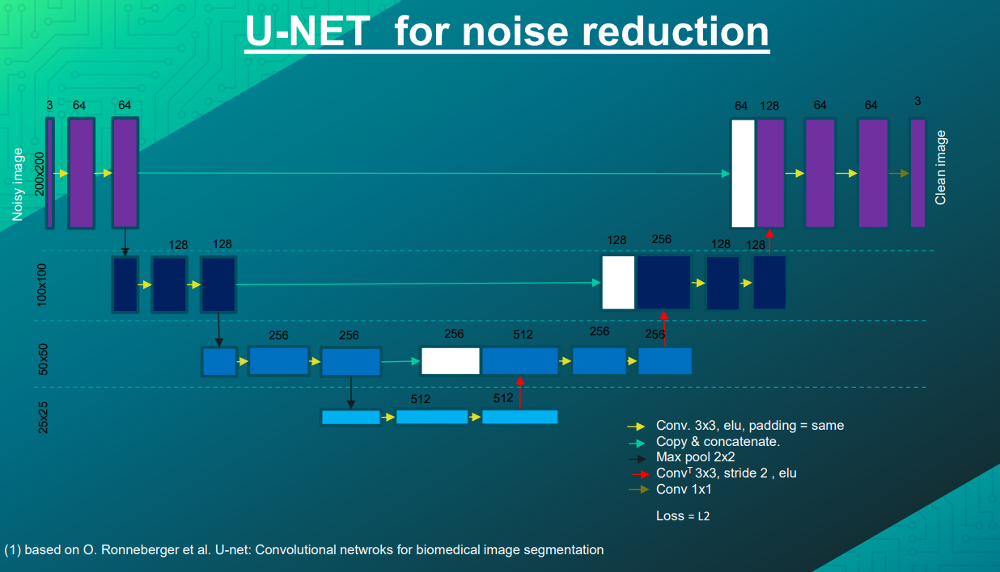

In [29]:
class UNet(nn.Module):
    def __init__(self, dropout=0.3):
        super(UNet, self).__init__()

        seed = 42  # Any fixed integer
        torch.manual_seed(seed)  # Ensures random values for weights are consistent
        torch.cuda.manual_seed(seed)
        '''
        encoder part
        '''
        self.conv1_enlarge_channels = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1)  # with 3x3 kernel, padding of 1 saves the input length.
        self.normalize1_after_enlarge = nn.BatchNorm2d(64)
        self.conv1_save_channels_encoder = nn.Conv2d( 64,  64, kernel_size=3, stride=1, padding=1)
        self.normalize1_after_save = nn.BatchNorm2d(64)
        self.conv2_enlarge_channels = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.normalize2_after_enlarge = nn.BatchNorm2d(128)
        self.conv2_save_channels_encoder = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        self.normalize2_after_save = nn.BatchNorm2d(128)
        self.conv3_enlarge_channels = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.normalize3_after_enlarge = nn.BatchNorm2d(256)
        self.conv3_save_channels_encoder = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.normalize3_after_save = nn.BatchNorm2d(256)
        self.conv4_enlarge_channels = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)
        self.conv4_save_channels_encoder = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1)
        self.normalize4_after_enlarge = nn.BatchNorm2d(512)
        self.normalize4_after_save = nn.BatchNorm2d(512)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.dropout = nn.Dropout(dropout)  # Added dropout layer

        # check about dropout
        self.elu = nn.ELU(alpha=1.0)
        '''
        decoder part
        '''
        self.transpose_conv1 = nn.ConvTranspose2d(512, 512, kernel_size=2, stride=2)
        self.conv1_reduce_channels = nn.Conv2d(512+256, 256, kernel_size=3, stride=1, padding=1)
        # padding = 0, output size = stride * (input_size-1) + kernel_size - 2*padding, if we want
        # to enlarge by a factor of 2 ( because we want to return to the original dimensions, and the max pool divided each time by 2),
        # we will take kernel= 2x2, stride=2, padding=0.

        self.transpose_conv2 = nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2)
        self.conv2_reduce_channels = nn.Conv2d(256+128, 128, kernel_size=3, stride=1, padding=1)

        self.transpose_conv3 = nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2)
        self.conv3_reduce_channels = nn.Conv2d(128+64, 64, kernel_size=3, stride=1, padding=1)

        self.conv4_reduce_channels = nn.Conv2d(64, 1, kernel_size=1)  # kernel 1x1.

        self.conv1_save_channels_decoder = nn.Conv2d( 64,  64, kernel_size=3, stride=1, padding=1)
        self.conv2_save_channels_decoder = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        self.conv3_save_channels_decoder = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.conv4_save_channels_decoder = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1)
        # self.fc1 = nn.Linear(64 * 7 * 7, 512)
        # self.fc2 = nn.Linear(512, 10)
        # self.to("cuda")
        self.to(device)

    def forward(self, input):
        '''
        encoder part
        '''
        s1 = self.elu(self.normalize1_after_enlarge(self.conv1_enlarge_channels(input)))  # enlarging the amount of channels from 3 to 64 with 3x3 convolution, stride 1, padding that save the length
        s1 = self.elu(self.normalize1_after_save(self.conv1_save_channels_encoder(s1)))  # saving the amount of channels from 64 to 64 with 3x3 convolution, stride 1, padding that save the length
        s2 = self.pool(s1)  # maxpool, each time we divide the size by 2.

        s2 = self.elu(self.normalize2_after_enlarge(self.conv2_enlarge_channels(s2)))  # enlarging the amount of channels from 64 to 128 with 3x3 convolution, stride 1, padding that save the length
        s2 = self.elu(self.normalize2_after_save(self.conv2_save_channels_encoder(s2)))  # saving the amount of channels from 128 to 128 with 3x3 convolution, stride 1, padding that save the length
        s3 = self.pool(s2)  # maxpool

        s3 = self.elu(self.normalize3_after_enlarge(self.conv3_enlarge_channels(s3)))  # enlarging the amount of channels from 128 to 256 with 3x3 convolution, stride 1, padding that save the length
        s3 = self.elu(self.normalize3_after_save(self.conv3_save_channels_encoder(s3)))  # saving the amount of channels from 256 to 256 with 3x3 convolution, stride 1, padding that save the length
        s4 = self.pool(s3)  # maxpool

        '''
        bottle neck
        '''
        s4 = self.elu(self.normalize4_after_enlarge(self.conv4_enlarge_channels(s4)))  # enlarging the amount of channels from 256 to 512 with 3x3 convolution, stride 1, padding that save the length
        s4 = self.elu(self.normalize4_after_save(self.conv4_save_channels_encoder(s4)))  # saving the amount of channels from 512 to 512 with 3x3 convolution, stride 1, padding that save the length
        s4 = self.dropout(s4)

        '''
        decoder part
        '''

        s5 = self.elu(self.transpose_conv1(s4))
        s5 = torch.cat((s3, s5), dim=1)  # Concatenate along the channel dimension
        s5 = self.elu(self.conv1_reduce_channels(s5))  # making the amount of channels from 512+256 to 256
        s5 = self.elu(self.conv3_save_channels_decoder(s5))  # doing 3x3 convolution from 256 to 256 channels.

        s6 = self.elu(self.transpose_conv2(s5))
        s6 = torch.cat((s2, s6), dim=1)  # Concatenate along the channel dimension
        s6 = self.elu(self.conv2_reduce_channels(s6))  # making the amount of channels from 128+256 to 128
        s6 = self.elu(self.conv2_save_channels_decoder(s6))  # doing 3x3 convolution from 128 to 128 channels.

        s7 = self.elu(self.transpose_conv3(s6))
        s7 = torch.cat((s1, s7), dim=1)  # Concatenate along the channel dimension
        s7 = self.elu(self.conv3_reduce_channels(s7))  # making the amount of channels from 64+128 to 64
        s7 = self.elu(self.conv1_save_channels_decoder(s7))  # doing 3x3 convolution from 64 to 64 channels.

        s8 = self.conv4_reduce_channels(s7)

        return s8


torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
seed = 42  # Any fixed integer
torch.manual_seed(seed)  # Ensures random values for weights are consistent
torch.cuda.manual_seed(seed)

In [30]:
class DoubleConvolution(nn.Module):
    def __init__(self, input_channels, output_channels, dropout_rate=0.2):
        super(DoubleConvolution, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv1d(input_channels, output_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(output_channels),
            nn.ELU(alpha=1.0),
            nn.Dropout(p=dropout_rate),  # Dropout after activation

            nn.Conv1d(output_channels, output_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(output_channels),
            nn.ELU(alpha=1.0),
            nn.Dropout(p=dropout_rate)  # Dropout after activation
        )

    def forward(self, input):
        return self.double_conv(input)


class Down_Maxpool(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(Down_Maxpool, self).__init__()
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2, padding=0)
        self.double_convolution = DoubleConvolution(input_channels, output_channels)

    def forward(self, input):
        return self.double_convolution(self.pool(input))


class Up_Transposed_Convolution_Concatenate(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(Up_Transposed_Convolution_Concatenate, self).__init__()
        self.transpose_conv1 = nn.ConvTranspose1d(input_channels, input_channels, kernel_size=2, stride=2)
        self.conv_reduce_channels = DoubleConvolution(input_channels+output_channels, output_channels)

    def forward(self, input, copy):
        input = self.transpose_conv1(input)
        copy_cat_input = torch.cat((copy, input), dim=1)
        return self.conv_reduce_channels(copy_cat_input)


class UNet2_Using_Building_Block(nn.Module):
    def __init__(self, dropout=0.3, dropout_reduce_channels=0.2):
        super(UNet2_Using_Building_Block, self).__init__()
        '''
        encoder part
        '''
        self.conv1 = DoubleConvolution(1, 64, dropout_rate=dropout)
        self.down1 = Down_Maxpool(64, 128)
        self.down2 = Down_Maxpool(128, 256)
        self.down3 = Down_Maxpool(256, 512)
        self.down4 = Down_Maxpool(512, 1024)
        '''
        bottle neck
        '''
        self.conv2 = nn.Sequential(
            DoubleConvolution(1024, 1024, dropout_rate=dropout),
            nn.Dropout(p=dropout)
        )
        self.conv3 = nn.Sequential(
            DoubleConvolution(1024, 1024, dropout_rate=dropout),
            nn.Dropout(p=dropout)
        )
        '''
        decoder part
        '''
        self.up1 = Up_Transposed_Convolution_Concatenate(1024, 512)
        self.up2 = Up_Transposed_Convolution_Concatenate(512, 256)
        self.up3 = Up_Transposed_Convolution_Concatenate(256, 128)
        self.up4 = Up_Transposed_Convolution_Concatenate(128, 64)
        self.conv4_reduce_channels = nn.Sequential(
            nn.Dropout(p=dropout_reduce_channels),
            nn.Conv1d(64, 1, kernel_size=1)  # kernel 1x1.
        )

        self.to(device)


    def forward(self, input):
        if isinstance(input, list):  # for GridSearchCV
            input = torch.stack(input)
        s1 = self.conv1(input)
        s2 = self.down1(s1)
        s3 = self.down2(s2)
        s4 = self.down3(s3)
        s5 = self.down4(s4)

        s5 = self.conv2(s5)
        s5 = self.conv3(s5)

        s = self.up1(s5, s4)
        s = self.up2(s, s3)
        s = self.up3(s, s2)
        s = self.up4(s, s1)
        return self.conv4_reduce_channels(s)
    
"""
We wrote two versions of the same U-Net, the first one didn't work, so we tried to find another way to implement it,
In the second implementation we partially utilized the link down below
https://github.com/milesial/Pytorch-UNet/
Our original implementation is collapsed in the cell above.
"""
pass

In [31]:
model = UNet2_Using_Building_Block()
model.to(device)
criterion = nn.MSELoss()
optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
num_epochs = 1000
train_losses = []
val_losses = []
print(f"parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6}M")

parameters: 25.847425M


c:\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [32]:
def train(model, optimizer, criterion, scheduler, train_loader, test_loader, num_epochs):
    for epoch in range(num_epochs):
        running_loss = 0.0
        model.train()
        count = 0
        for inputs, targets, metadata in tqdm(train_loader):  # lomet fix it to our's
            count += 1
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()       # Reset gradients
            outputs = model(inputs)        # Forward pass
            loss = criterion(outputs, targets)  # Compute loss
            loss.backward()                # Backpropagation
            optimizer.step()               # Update weights
            running_loss += loss.item()
        print(f"training in epoch {epoch}, progress: 100%")

        # Validation phase
        if epoch % 2 == 0:
            train_loss = running_loss/len(train_loader)
            train_losses.append(train_loss)
            model.eval()
            val_loss = 0.0
            with torch.no_grad():
                count = 0
                for inputs, targets, metadata in tqdm(test_loader):
                    inputs, targets = inputs.to(device), targets.to(device)
                    count += 1

                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()
            val_loss = val_loss/len(test_loader)
            val_losses.append(val_loss)
            scheduler.step(val_loss)

        print(f"validating in epoch {epoch}, progress: 100%")

        # save
        if not epoch % 2:
            torch.save({
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'criterion': criterion,
                'epoch': epoch,
                'train_loss': train_losses,
                'val_loss': val_losses
            }, f"H:/ai_training/unet_waveform_improved/librispeech_unet_{epoch}.pth")

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

    return model, optimizer, scheduler, epoch, train_losses, val_losses

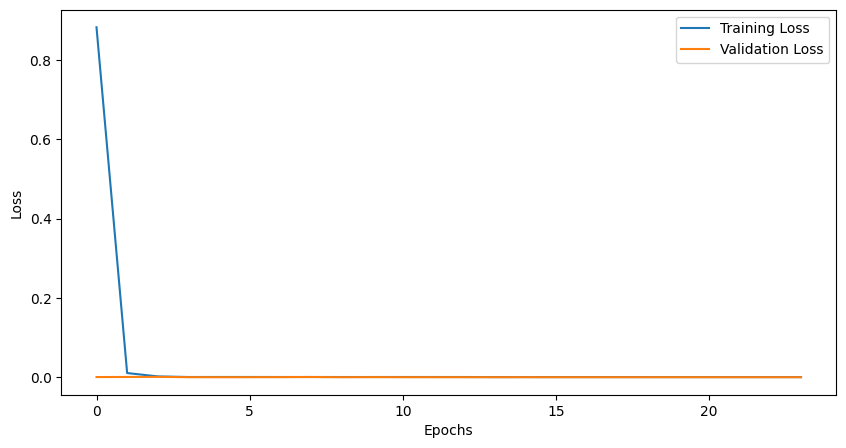

In [33]:
# model, optimizer, scheduler, epoch, train_losses, val_losses = train(model, optimizer, criterion, scheduler, train_loader, test_loader, num_epochs)
model, optimizer, scheduler, epoch, train_losses, val_losses = load(f"./final_models/librispeech_unet_46.pth", model, optimizer, scheduler)
plot_losses(epoch, train_losses, val_losses)

In [34]:
# show all the losses for each epoch
for train, val, _epoch in zip(train_losses, val_losses, range(1, epoch)):
    print(f"Epoch {_epoch * 2}/{epoch + 1}, Train Loss: {train:.4f}, Val Loss: {val:.4f}")

Epoch 2/48, Train Loss: 0.8824, Val Loss: 0.0008
Epoch 4/48, Train Loss: 0.0109, Val Loss: 0.0010
Epoch 6/48, Train Loss: 0.0024, Val Loss: 0.0012
Epoch 8/48, Train Loss: 0.0009, Val Loss: 0.0005
Epoch 10/48, Train Loss: 0.0010, Val Loss: 0.0004
Epoch 12/48, Train Loss: 0.0010, Val Loss: 0.0005
Epoch 14/48, Train Loss: 0.0009, Val Loss: 0.0007
Epoch 16/48, Train Loss: 0.0009, Val Loss: 0.0010
Epoch 18/48, Train Loss: 0.0009, Val Loss: 0.0004
Epoch 20/48, Train Loss: 0.0009, Val Loss: 0.0007
Epoch 22/48, Train Loss: 0.0009, Val Loss: 0.0005
Epoch 24/48, Train Loss: 0.0009, Val Loss: 0.0004
Epoch 26/48, Train Loss: 0.0009, Val Loss: 0.0004
Epoch 28/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoch 30/48, Train Loss: 0.0007, Val Loss: 0.0005
Epoch 32/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoch 34/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoch 36/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoch 38/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoch 40/48, Train Loss: 0.0007, Val Loss: 0.0004
Epoc

In [35]:
# load custom sound
sample_audio = list(torchaudio.load("./normalized_data/librispeech/test-clean/61/70968/61-70968-0017.flac"))
song = sample_audio[0][0].unsqueeze(0).unsqueeze(0)
dirty_audio = list(torchaudio.load("./normalized_data/librispeech/test-clean/61/70968/61-70968-0017.dirty.flac"))
dirty_song = dirty_audio[0][0].unsqueeze(0).unsqueeze(0)

In [36]:
ipd.Audio(song[0].numpy(), rate=16000)

In [37]:
ipd.Audio(dirty_song[0], rate=16000)

In [38]:
# prediction
ipd.Audio(model(dirty_song.to(device)).detach().cpu().squeeze().numpy(), rate=16000)

In [39]:
def create_spectrogram(audio, sr=16000, hop_length=512, n_fft=2048, n_mels=256, max_len=400):
    # STFT with 75% overlap
    window = np.blackman(n_fft)
    D = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window=window, center=True)

    # Convert to mel and back
    mel_basis = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels, htk=True)
    mel_spec = np.dot(mel_basis, np.abs(D))
    phase = np.angle(D)

    return mel_spec, {"phase": phase[:, :max_len], "mel_basis": mel_basis, "spec_shape": (mel_spec.shape[0], max_len)}

def reconstruct_audio(mel_spec, metadata):
    # Reconstruct
    window = np.blackman(2048)
    S = np.dot(np.linalg.pinv(metadata["mel_basis"], rcond=1e-10), mel_spec)
    reconstructed = librosa.istft(S * np.exp(1j * metadata["phase"]), hop_length=512, window=window)
    return reconstructed / np.max(np.abs(reconstructed))

In [40]:
dirty_spectrogram, spectrogram, metadata = train_dataset_spectrogram[0]
# reconstruct audio
ipd.Audio(reconstruct_audio(dirty_spectrogram.squeeze(0), metadata["dirty"]), rate=metadata['metadata'][1])

In [41]:
# reconstruct clean
ipd.Audio(reconstruct_audio(spectrogram.squeeze(0), metadata["clean"]), rate=metadata['metadata'][1])

In [42]:
# original
ipd.Audio(metadata["original"][0], rate=metadata['metadata'][1])

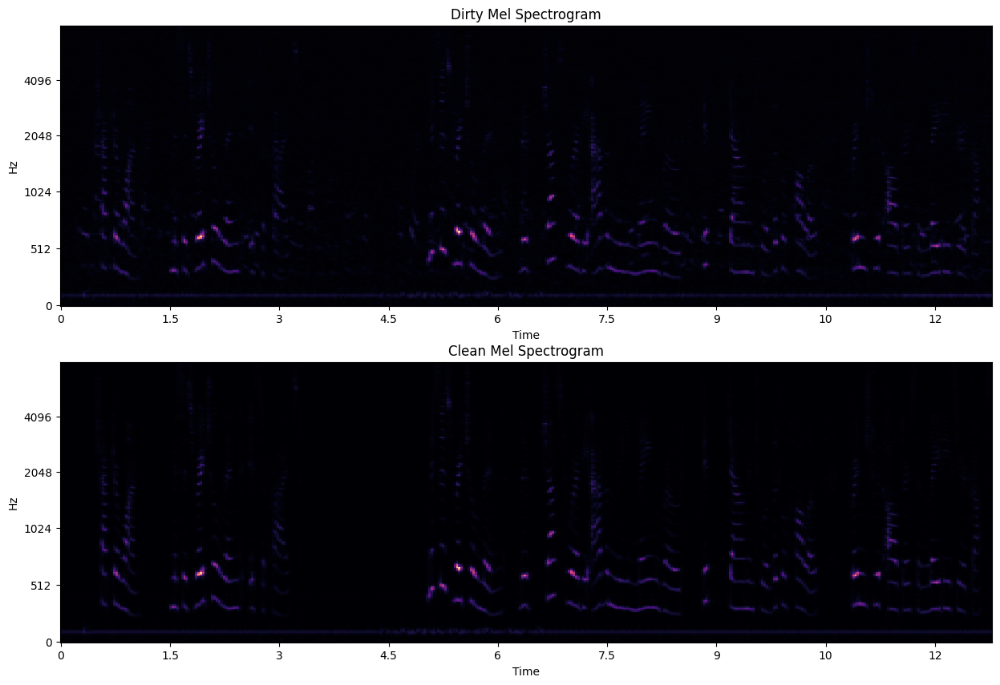

reconstructed audio:


In [43]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
librosa.display.specshow(dirty_spectrogram[0].squeeze().cpu().numpy(), sr=16000, x_axis='time', y_axis='mel', hop_length=512, ax=ax[0])
ax[0].set_title('Dirty Mel Spectrogram')

librosa.display.specshow(clean_spectrogram[0].squeeze().cpu().numpy(), sr=16000, x_axis='time', y_axis='mel', hop_length=512, ax=ax[1])
ax[1].set_title('Clean Mel Spectrogram')

plt.show()

print("reconstructed audio:")
ipd.Audio(reconstruct_audio(clean_spectrogram[0].squeeze().cpu().numpy(), metadata["clean"]), rate=metadata['metadata'][1])

In [44]:
class DoubleConvolutionMel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(DoubleConvolutionMel, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(output_channels),
            nn.ELU(alpha=1.0),
            nn.Conv2d(output_channels, output_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(output_channels),
            nn.ELU(alpha=1.0)
        )

    def forward(self, input):
        return self.double_conv(input)


class Down_Maxpool(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(Down_Maxpool, self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.double_convolution = DoubleConvolutionMel(input_channels, output_channels)

    def forward(self, input):
        return self.double_convolution(self.pool(input))


class Up_Transposed_Convolution_ConcatenateMel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(Up_Transposed_Convolution_ConcatenateMel, self).__init__()
        self.transpose_conv1 = nn.ConvTranspose2d(input_channels, input_channels, kernel_size=2, stride=2)
        self.conv_reduce_channels = DoubleConvolutionMel(input_channels+output_channels, output_channels)

    def forward(self, input, copy):
        input = self.transpose_conv1(input)
        copy_cat_input = torch.cat((copy, input), dim=1)
        return self.conv_reduce_channels(copy_cat_input)


class UNet2_Using_Building_BlockMel(nn.Module):
    def __init__(self):
        super(UNet2_Using_Building_BlockMel, self).__init__()
        '''
        encoder part
        '''
        self.conv1 = DoubleConvolutionMel(1, 64)
        self.down1 = Down_Maxpool(64, 128)
        self.down2 = Down_Maxpool(128, 256)
        self.down3 = Down_Maxpool(256, 512)
        self.down4 = Down_Maxpool(512, 1024)
        '''
        bottleneck
        '''
        self.conv2 = DoubleConvolutionMel(1024, 1024)
        self.conv3 = DoubleConvolutionMel(1024, 1024)
        '''
        decoder part
        '''
        self.up1 = Up_Transposed_Convolution_ConcatenateMel(1024, 512)
        self.up2 = Up_Transposed_Convolution_ConcatenateMel(512, 256)
        self.up3 = Up_Transposed_Convolution_ConcatenateMel(256, 128)
        self.up4 = Up_Transposed_Convolution_ConcatenateMel(128, 64)
        self.conv4_reduce_channels = nn.Conv2d(64, 1, kernel_size=1)  # kernel 1x1.
        self.to(device)

    def forward(self, input):
        s1 = self.conv1(input)
        s2 = self.down1(s1)
        s3 = self.down2(s2)
        s4 = self.down3(s3)
        s5 = self.down4(s4)

        s5 = self.conv2(s5)
        s5 = self.conv3(s5)

        s = self.up1(s5, s4)
        s = self.up2(s, s3)
        s = self.up3(s, s2)
        s = self.up4(s, s1)
        # return self.conv4_reduce_channels(s)
        return self.conv4_reduce_channels(s)

In [45]:
model_mel = UNet2_Using_Building_BlockMel()
model_mel.to("cuda")
criterion_mel = nn.MSELoss()
optimizer_mel = optim.AdamW(model_mel.parameters(), lr=0.01, weight_decay=1e-4)
scheduler_mel = optim.lr_scheduler.ReduceLROnPlateau(optimizer_mel, 'min', patience=3, verbose=True)
num_epochs_mel = 100
train_losses = []
val_losses = []
print(f"parameters: {sum(p.numel() for p in model_mel.parameters() if p.requires_grad) / 1e6}M")


parameters: 74.713089M


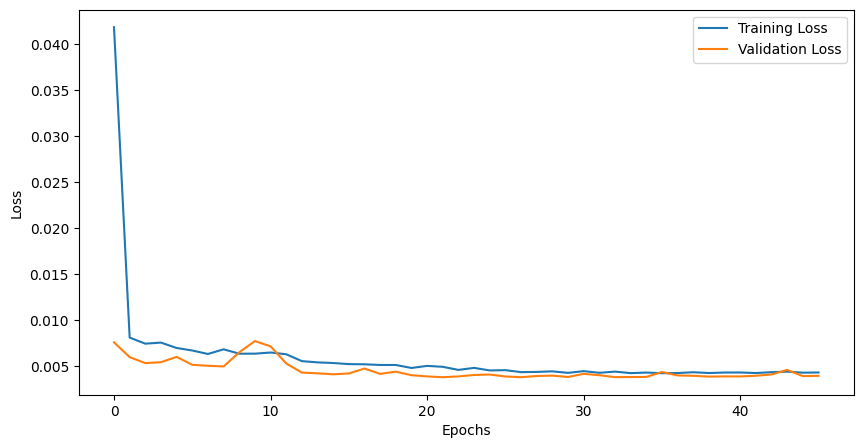

In [46]:
# model_mel, optimizer_mel, scheduler_mel, epoch_mel, train_losses_mel, val_losses_mel = train(model, optimizer, criterion, scheduler, train_loader, test_loader, num_epochs)
model_mel, optimizer_mel, scheduler_mel, epoch_mel, train_losses_mel, val_losses_mel = load(f"./final_models/librispeech_unet_mel_90.pth", model_mel, optimizer_mel, scheduler_mel)
plot_losses(epoch_mel, train_losses_mel, val_losses_mel)

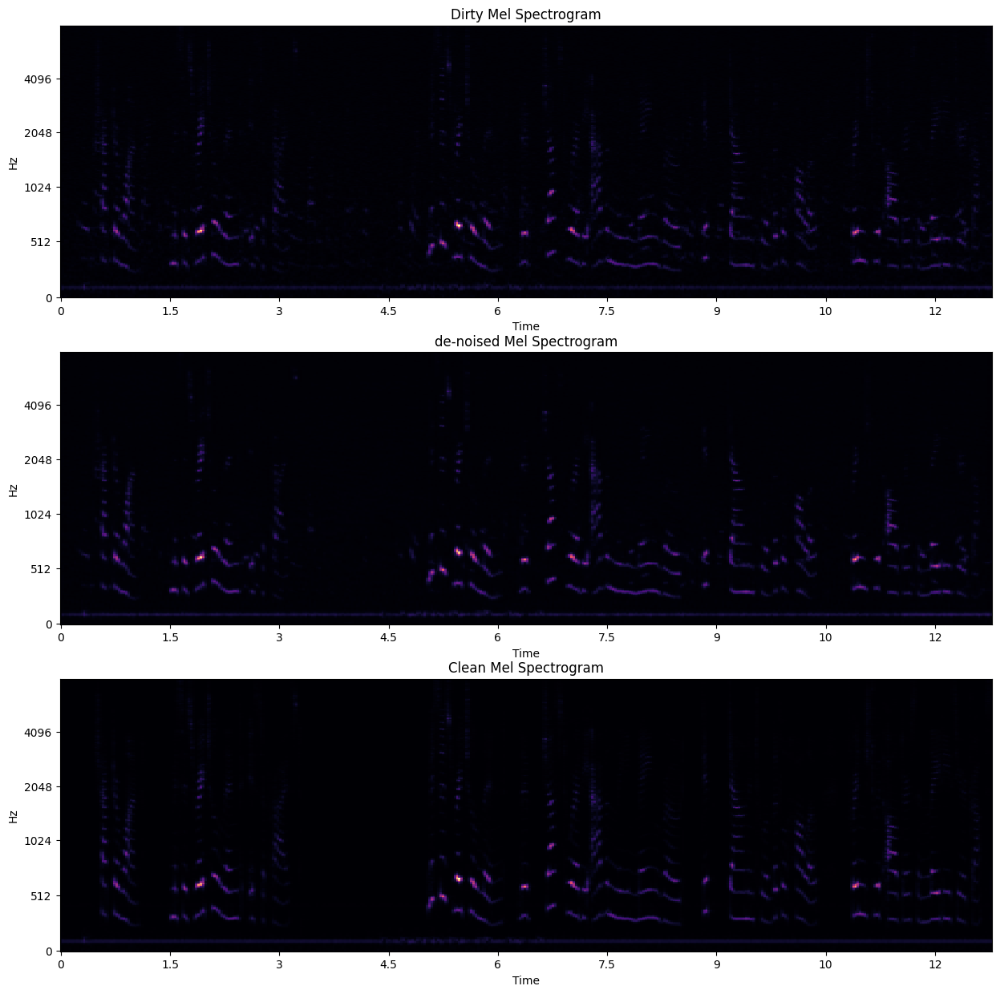

In [47]:
model_mel.eval()
with torch.no_grad():
    mel_spec_denoised = model_mel(dirty_spectrogram.to(device).unsqueeze(0))[0].squeeze().cpu().numpy()
    fig, ax = plt.subplots(3, 1, figsize=(15, 15))
    librosa.display.specshow(dirty_spectrogram[0].squeeze().cpu().numpy(), sr=16000, x_axis='time', y_axis='mel', hop_length=512, ax=ax[0])
    ax[0].set_title('Dirty Mel Spectrogram')

    librosa.display.specshow(mel_spec_denoised, sr=16000, x_axis='time', y_axis='mel', hop_length=512, ax=ax[1])
    ax[1].set_title('de-noised Mel Spectrogram')

    librosa.display.specshow(clean_spectrogram[0].squeeze().cpu().numpy(), sr=16000, x_axis='time', y_axis='mel', hop_length=512, ax=ax[2])
    ax[2].set_title('Clean Mel Spectrogram')

    plt.show()
    
ipd.Audio(reconstruct_audio(mel_spec_denoised, metadata["dirty"]), rate=16000)

In [48]:
ipd.Audio(reconstruct_audio(clean_spectrogram[0], metadata["clean"]), rate=16000)

In [49]:
def train_for_ray(config):
    model = UNet2_Using_Building_Block()
    criterion = nn.MSELoss()
    optimizer = optim.AdamW(model.parameters(), lr=config["lr"], weight_decay=config["weight_decay"])
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
    
    train_loader = DataLoader(
        LIBRISPEECH(root=r".\normalized_data", url="train-clean-100", download=False, limit=1000), 
        batch_size=batch_size,
        shuffle=True,
        collate_fn=collate_audio
    )
    test_loader = DataLoader(
        LIBRISPEECH(root=r".\normalized_data", url="test-clean", download=False, limit=1000), 
        batch_size=batch_size,
        shuffle=True,
        collate_fn=collate_audio
    )
    
    train_losses = []
    val_losses = []
    
    for epoch in range(config["num_epochs"]):
        running_loss = 0.0
        model.train()
        count = 0
        for inputs, targets, metadata in tqdm(train_loader):  # lomet fix it to our's
            count += 1
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()       # Reset gradients
            outputs = model(inputs)        # Forward pass
            loss = criterion(outputs, targets)  # Compute loss
            loss.backward()                # Backpropagation
            optimizer.step()               # Update weights
            running_loss += loss.item()
        print(f"training in epoch {epoch}, progress: 100%")

        # Validation phase
        if epoch % 2 == 0:
            train_loss = running_loss/len(train_loader)
            train_losses.append(train_loss)
            model.eval()
            val_loss = 0.0
            with torch.no_grad():
                count = 0
                for inputs, targets, metadata in tqdm(test_loader):
                    inputs, targets = inputs.to(device), targets.to(device)
                    count += 1

                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()
            val_loss = val_loss/len(test_loader)
            val_losses.append(val_loss)
            scheduler.step(val_loss)

        print(f"validating in epoch {epoch}, progress: 100%")

    
    # save
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'criterion': criterion,
        'epoch': epoch,
        'train_loss': train_losses,
        'val_loss': val_losses
    }, f"H:/ai_training/tuning_hyperparameters/librispeech_unet_{'__'.join(f'{k}_{v}' for k, v in config.items())}.pth")



config = {
    "weight_decay": tune.choice([1e-4, 1e-5]),
    "lr": tune.choice([1, 0.01, 0.001]),
    "batch_size": tune.choice([2, 4]),
    "num_epochs": tune.choice([10]),
}

result = tune.run(
    train_for_ray,
    resources_per_trial={"cpu": 1, "gpu": 1},
    config=config,
)

print("Best config: ", result.get_best_config(metric="loss", mode="min"))

2025-02-22 12:44:59,435	INFO worker.py:1832 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 
2025-02-22 12:45:02,326	INFO tune.py:253 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `tune.run(...)`.
2025-02-22 12:45:02,328	INFO tune.py:616 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949


2025-02-22 12:45:02,872	WARNING trial.py:647 -- The path to the trial log directory is too long (max length: 260. Consider using `trial_dirname_creator` to shorten the path. Path: C:\Users\Zombiegg\AppData\Local\Temp\ray\session_2025-02-22_12-44-55_202973_108588\artifacts\2025-02-22_12-45-02\train_for_ray_2025-02-22_12-45-02\driver_artifacts\train_for_ray_11dcf_00000_0_batch_size=2,lr=0.0010,num_epochs=10,weight_decay=0.0000_2025-02-22_12-45-02
2025-02-22 12:45:02,875	WARNING trial.py:647 -- The path to the trial log directory is too long (max length: 260. Consider using `trial_dirname_creator` to shorten the path. Path: C:\Users\Zombiegg\AppData\Local\Temp\ray\session_2025-02-22_12-44-55_202973_108588\artifacts\2025-02-22_12-45-02\train_for_ray_2025-02-22_12-45-02\driver_artifacts\train_for_ray_11dcf_00000_0_batch_size=2,lr=0.0010,num_epochs=10,weight_decay=0.0000_2025-02-22_12-45-02
2025-02-22 12:45:06,958	WARNING tune.py:219 -- Stop signal received (e.g. via SIGINT/Ctrl+C), ending R

Best config:  {'weight_decay': 1e-05, 'lr': 0.001, 'batch_size': 2, 'num_epochs': 10}


# Discussion
In the project we tried to implement two models.<br>
In the first implementation we considered the data as a waveform and in the second we considered the data as a picture of a mel spectrogram of the audio.<br>

In the first implementation the network trained better and we think one of the reasons for that is the runtime. In this model, all of our convolutions are just one dimensional, which means the model is less complicated and can train faster with more data.<br>
Its' output was the best of the two.<br>

In the second implementation the network trained alright but when we tried to reconstruct the audio we couldn't manage. We came up with two theories for why might that be:<br>
First, we didn't have the correct metadata (the phase of the audio) for the model's audio, and when we tried to reconstruct it it wasn't possible, even when we tried to use the clean or dirty's metadata.<br>
Another reason why we think this implementation didn't work is because it may seem that the picture is less noisy, but in practice we may have changed the value of some very important pixels that we can't see with our naked eye.<br>
Maybe if we have had more computational power, the model would've worked ok.<br>

One more interesting thing is that although the second network is much more complex than the first one, consisting of 74.713089 million parameters compared to the 25.847425 million params of the first one it still preformed worse, and we theorized that is because of the reasons mentioned above.

## Problems We Dealt With
We have attempted to train the second network for over a week with no tangible progress to be seen, at that point we decided to pivot towards training the first implementation, <br> that uses conv1D and works with the **raw** audio instead of the mel spectrogram. <br>
What's interesting is that although this network was much less complex than the mel spectrograms one, consisting of just 25.847 million parameters, <br> compared to the relatively large 74.7132 million params of the mel network (almost triple of what the new one had), it fared way better and managed to successfully lower the noise in our audio tracks. <br>
Much of that is for the reasons we theorized above, those being the possibility that it may have modified the phase, and the fact that the model might have removed important pixels that with our naked eye we can easily miss.

## Future Work
In the future we would like to improve the first model.
We think to do this by creating another dataset of softer noises and continuing to train the model from where we left it. <br>
Furthermore, we would like to create more models, for example, by using Wavenet to achieve the same goal. <br>
In addition, we would have liked to tune the best hyperparameters with the code that was previously shown but we didn't have enough computational power. Just to train all of those models took us at least 20 hours each. <br>
To overcome this problem, we thought of doing the tuning process with less data and epochs, but it may not find the best params for all of the data and more epochs. <br>

# Conclusion
We have decided to choose the first model as it worked better in our testing and provided greater results.